# NMF on normalized transitions

So far the factorization has been performed on a non normalized subsection of the transition matrices. However in this section we will take a look at the result of row normalizing the data.

In [1]:
from sklearn.feature_extraction.text import CountVectorizer
from spmf import Spmf
import numpy as np
import pandas as pd
import os
import re
import matplotlib.pyplot as plt
import ast
pd.options.plotting.backend = "plotly"
import plotly.express as px
# from chart_studio import plotly
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.subplots as sp
pd.options.display.max_colwidth = None
pd.set_option('display.max_rows', 70)
from pandas.plotting import table 
import nltk
import seaborn as sns
%matplotlib inline
import random
import matplotlib.gridspec as grid
import matplotlib
from sklearn.decomposition import NMF

In [2]:
commoparable_transitions=pd.read_csv("comparable_transitions_1000_most_common.csv")
commoparable_transitions=commoparable_transitions.set_index(['package_name','next_app'])

In [4]:
data=pd.read_csv("names_with_app_clusters.csv",usecols=['user_id','package_name','session'])
data['next_app']=data.groupby(['user_id','session']).package_name.shift(-1)
data=data.set_index('user_id')

## Column normalization
In this section we column normalize in order to compensate for the different activity level of the users.

In [5]:
col_normailized=commoparable_transitions[set(commoparable_transitions.columns)-set(['transition'])].sub(commoparable_transitions[set(commoparable_transitions.columns)-set(['transition'])].min(axis=0),axis=1).div(commoparable_transitions[set(commoparable_transitions.columns)-set(['transition'])].max(axis=0)-commoparable_transitions[set(commoparable_transitions.columns)-set(['transition'])].min(axis=0),axis=1)

In [8]:
X=col_normailized

model = NMF(n_components=7, init='random', random_state=0)
W = model.fit_transform(X)
H = model.components_

W=pd.DataFrame(W)
H=pd.DataFrame(H)

W['transition']=['{} -> {}'.format(i[0], i[1]) for i in commoparable_transitions.index[W.index]]
W['next_app']=commoparable_transitions.reset_index()['next_app']

W=W.sort_values(['next_app','transition'])
W=W.drop(columns=['next_app'])
W=W.rename(columns={0:'Factor 1',1:'Factor 2',2:'Factor 3',3:'Factor 4',4:'Factor 5',5:'Factor 6',6:'Factor 7'})

We check the relationship between the seven factors in the plot below. Factor seven appear to be mainly capturing one transitions, but overall the relationship between the factors appear independent, and it is therefore deemed acceptable to continue with.

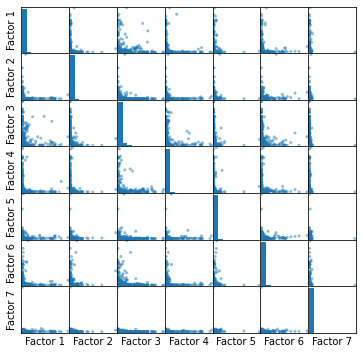

In [9]:
plt.setp(pd.plotting.scatter_matrix(W,figsize=(6,6)),xticks=[], yticks=[])
plt.savefig("NMF_row_norm_corr_7factors.pdf", 
               bbox_inches='tight', 
               transparent=True,
               pad_inches=0)
plt.show()

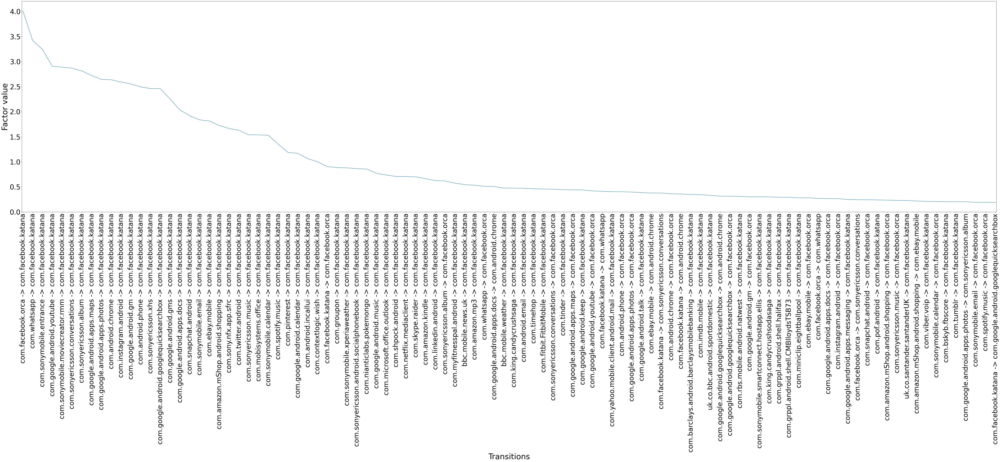

In [14]:
plt.figure(figsize=(90, 20), dpi=80)
W_f1=W[W['Factor 1'].isin(W['Factor 1'].nlargest(100))]
W_f1=W_f1.sort_values('Factor 1',ascending=False)
plt.plot(W_f1['transition'],W_f1['Factor 1'],label='Factor 1')
plt.xticks(fontsize=35, rotation=90)
plt.yticks(fontsize=35)
plt.margins(x=0.001)
plt.xlabel('Transitions',fontsize=40)
plt.ylabel('Factor value',fontsize=40)
plt.savefig("factor1_col_norm_top100.pdf", 
               bbox_inches='tight', 
               transparent=True,
               pad_inches=0)
plt.show()

Captur similar behaviour as the facebook component.

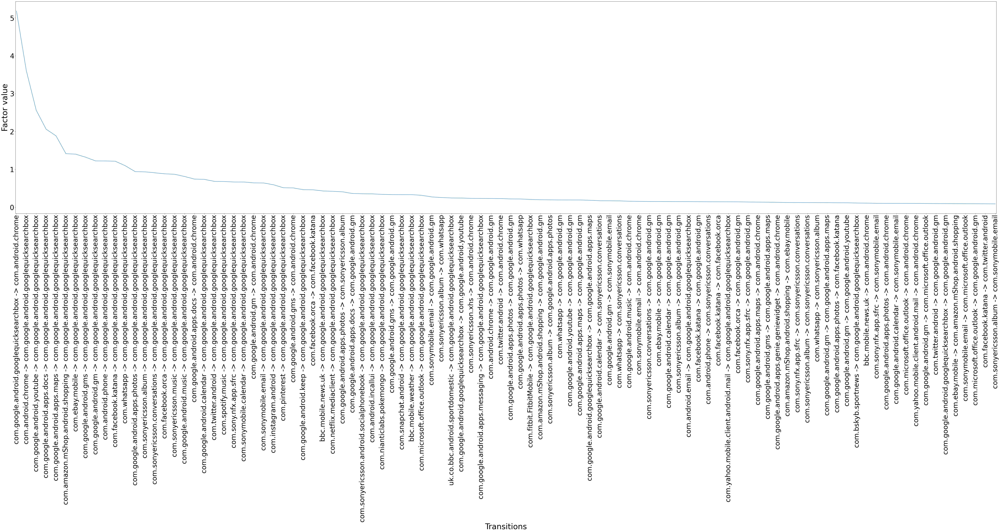

In [16]:
plt.figure(figsize=(90, 20), dpi=80)
W_f2=W[W['Factor 2'].isin(W['Factor 2'].nlargest(100))]
W_f2=W_f2.sort_values('Factor 2',ascending=False)
plt.plot(W_f2['transition'],W_f2['Factor 2'],label='Factor 2')
plt.xticks(fontsize=35, rotation=90)
plt.yticks(fontsize=35) 
plt.margins(x=0.001)
plt.xlabel('Transitions',fontsize=40)
plt.ylabel('Factor value',fontsize=40)
plt.savefig("factor2_col_norm_100.pdf", 
               bbox_inches='tight', 
               transparent=True,
               pad_inches=0)
plt.show()

Capture similar component as the google component.

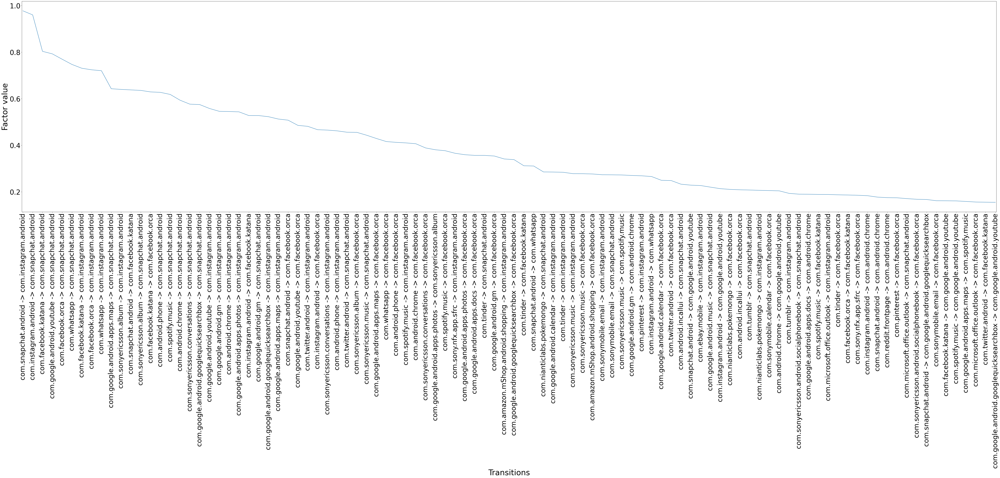

In [18]:
plt.figure(figsize=(90, 20), dpi=80)
W_f3=W[W['Factor 3'].isin(W['Factor 3'].nlargest(100))]
W_f3=W_f3.sort_values('Factor 3',ascending=False)
plt.plot(W_f3['transition'],W_f3['Factor 3'],label='Factor 3')
plt.xticks(fontsize=35, rotation=90)
plt.yticks(fontsize=35)
plt.margins(x=0.001)
plt.xlabel('Transitions',fontsize=40)
plt.ylabel('Factor value',fontsize=40)
plt.savefig("factor3_col_norm_100.pdf", 
               bbox_inches='tight', 
               transparent=True,
               pad_inches=0)
plt.show()

Capture very similar behaviour as the social media - multimedia component.

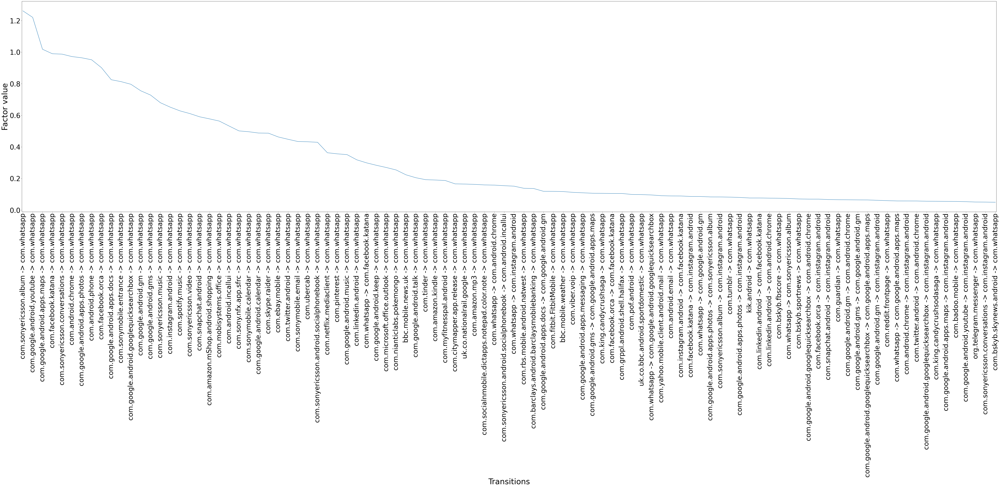

In [19]:
plt.figure(figsize=(90, 20), dpi=80)
W_f4=W[W['Factor 4'].isin(W['Factor 4'].nlargest(100))]
W_f4=W_f4.sort_values('Factor 4',ascending=False)
plt.plot(W_f4['transition'],W_f4['Factor 4'],label='Factor 4')
plt.xticks(fontsize=35, rotation=90)
plt.yticks(fontsize=35)
plt.margins(x=0.001)
plt.xlabel('Transitions',fontsize=40)
plt.ylabel('Factor value',fontsize=40)
plt.savefig("factor4_col_norm_100.pdf", 
               bbox_inches='tight', 
               transparent=True,
               pad_inches=0)
plt.show()

Capture behaviour similar to the whatsapp component.

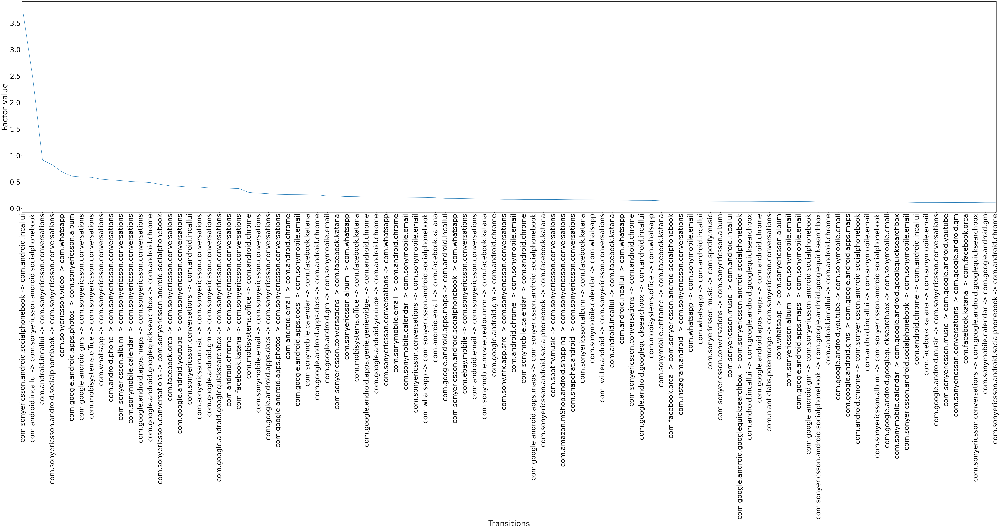

In [20]:
plt.figure(figsize=(90, 20), dpi=80)
W_f5=W[W['Factor 5'].isin(W['Factor 5'].nlargest(100))]
W_f5=W_f5.sort_values('Factor 5',ascending=False)
plt.plot(W_f5['transition'],W_f5['Factor 5'],label='Factor 5')
plt.xticks(fontsize=35, rotation=90)
plt.yticks(fontsize=35)
plt.margins(x=0.001)
plt.xlabel('Transitions',fontsize=40)
plt.ylabel('Factor value',fontsize=40)
plt.savefig("factor5_col_norm_100.pdf", 
               bbox_inches='tight', 
               transparent=True,
               pad_inches=0)
plt.show()

Very similar to the trannsitions captured by the traditional communication component.

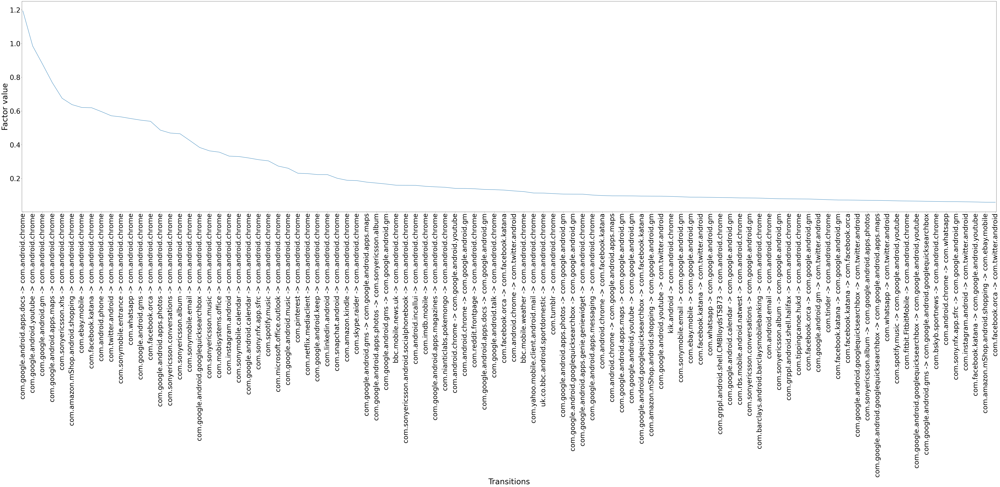

In [22]:
plt.figure(figsize=(90, 20), dpi=80)
W_f6=W[W['Factor 6'].isin(W['Factor 6'].nlargest(100))]
W_f6=W_f6.sort_values('Factor 6',ascending=False)
plt.plot(W_f6['transition'],W_f6['Factor 6'],label='Factor 6')
plt.xticks(fontsize=35, rotation=90)
plt.yticks(fontsize=35)
plt.margins(x=0.001)
plt.xlabel('Transitions',fontsize=40)
plt.ylabel('Factor value',fontsize=40)
plt.savefig("factor6_col_norm_100.pdf", 
               bbox_inches='tight', 
               transparent=True,
               pad_inches=0)
plt.show()

Similar to the chrome component.

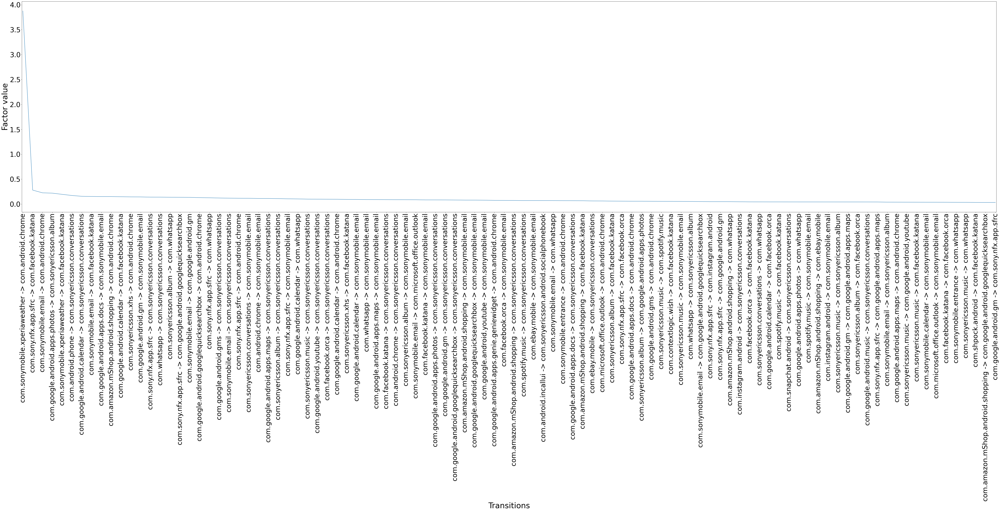

In [23]:
plt.figure(figsize=(90, 20), dpi=80)
W_f7=W[W['Factor 7'].isin(W['Factor 7'].nlargest(100))]
W_f7=W_f7.sort_values('Factor 7',ascending=False)
plt.plot(W_f7['transition'],W_f7['Factor 7'],label='Factor 7')
plt.xticks(fontsize=35, rotation=90)
plt.yticks(fontsize=35)
plt.margins(x=0.001)
plt.xlabel('Transitions',fontsize=40)
plt.ylabel('Factor value',fontsize=40)
plt.savefig("factor7_col_norm_100.pdf", 
               bbox_inches='tight', 
               transparent=True,
               pad_inches=0)
plt.show()

Similar to the weather component.

Since the factors capture similar behaviour as the component found for with NMF before normalization, we will not continue the analysis based on these, as the results are expected to be similar as those found before normalization.